# House Prices Prediction

In this project, I try to make a house price predictions using the <b>Regression</b> technique. 
I develop several Regression models and in a later section I will decide which model is best for predicting prices for an unknown data based on several attributes.
The attributes and the data used on this project are obtained from the Kaggle dataset located at this <a href="https://www.kaggle.com/shree1992/housedata">link</a>, the house prices data are also presented on the same Github folder as this notebook.
This projects is aimed at homeowners who are interested in knowing what relevant factors affect home prices and want to decide the best price for their houses based on some characteristics.

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis and Prediction](#analysis)
* [Decision Making](#decision)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)


## Introduction: Business Problems <a name="introduction">

House prices are influenced by many factors. Two different houses located next to each other may have a different selling prices due to the different existing features. For instance, one house have three floors, while another house have only one floor. Not to mention other features in the houses that cannot be seen from the outside. For this reason, it is difficult to estimate the price a house. Homeowners may not know what factors have the most influence on the house price, and whether they set a rational price based on the characteristics of the house.

This project provides step-by-step analysis as well as predictions to help home owners decide on the right house price based on the existing home features. In particular, the following steps will be included in this notebook:

1. Analyze and explore the relationship between different house characteristics in influencing home price
2. Determine the relevant characteristics of the house
3. Develop several Regression models to predict house prices
4. Evaluate the accuracy for each model
5. Recommend the best Regression model

## Data <a name="data">

The housing price data are obtained from a <a href="https://www.kaggle.com/shree1992/housedata">Kaggle data repository</a> published by a Kaggle user named Shree.

The dataset contains data about the real estate markets in Sydney and Melbourne. There are 4600 rows and 18 columns in the dataset. The data will be used to train prediction models to help in predicting future observations from the data.

The explanation for each column is as follows:
<ul>
    <li>Date: Date when the house is ready for sale.</li>
<li>Price: Price of the house to be sold.</li>
<li>Bedrooms: No. of bedrooms in the house.</li>
<li>Bathrooms: No. of bathrooms in the house.</li>
<li>Sqft_living: Squarefoot of Living in the house.</li>
<li>Sqft_lot: Squarefoot of Floor in the house.</li>
<li>Floors: Floors on which living area located.</li>
<li>Waterfront: If waterfront available in front of house.</li>
<li>View: View from the house.</li>
<li>Condition: Condition of the house.</li>
<li>Sqft_above: Squarefoot above is the space available at roof.</li>
<li>Sqft_basement: Squarefoot basement is the space available at the basement.</li>
<li>Yr_built: In which year the house is built.</li>
<li>Yr_renovated: Year of renovation.</li>
<li>Street: On which street house is located.</li>
<li>City: City in which the country is located.</li>
<li>Statezip: Zip code of the area in which house is located.</li>
<li>Country: Country is US.</li>
</ul>

### Import Needed Packages

In [1]:
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.style.use('ggplot') # optional: for ggplot-like style
import seaborn as sns

import pandas as pd
import pylab as pl
import numpy as np

from sklearn.model_selection import train_test_split 

# regression
from sklearn import linear_model
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

### Obtain and Preview the data

In [2]:
df = pd.read_csv('house_prices.csv')
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,2014-05-02 00:00:00,313000.0,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2014-05-02 00:00:00,2384000.0,5.0,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA
2,2014-05-02 00:00:00,342000.0,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,2014-05-02 00:00:00,420000.0,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA
4,2014-05-02 00:00:00,550000.0,4.0,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA


In [3]:
df.shape

(4600, 18)

Let's check to see if there any missing values in the dataset.

In [4]:
df.isnull().sum()

date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
street           0
city             0
statezip         0
country          0
dtype: int64

Great! No missing values are found, so we can continue working on the data for further analysis.

In [5]:
df.dtypes

date              object
price            float64
bedrooms         float64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
street            object
city              object
statezip          object
country           object
dtype: object

## Methodology <a name="methodology">

This project is for homeowners who are interested in finding relevant house features that affect the selling price of the home.

There are several processes involved in this project. First, the data needed to answer the problem will be collected through the right source. The data collection process has been conducted in the data section above.

Second, I will do Exploratory Data Analysis (EDA). To see the main characteristics and distribution of each predictor of house prices, I will make various plots, such as histograms and 
scatter plots. Regression plots will also be built to see what model is the most suitable for the relationship of the independent variables (house features) and the dependent variable (house price).

Third, I will make several prediction models and each model will be measured for Out-of-Sample Evaluation by visualizing the residual and distribution plot, then calculating the R-squared and MSE values.

Finally, I will discuss my findings on a non-technical basis so that my analysis can be easily understood by a wider audience.

## Analysis and Prediction<a name="analysis">

Now that our house price dataset has been loaded, let's use it to carry out further analysis and make predictions later.

### Data Exploration

I wil select the numeric features as the relevant characteristics of houses for making a price prediction, since categorical features do not add much value to our predictions.

In [5]:
features = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'sqft_above', 'sqft_basement']
target = ['price']

cdf = df[features + target]
df_f = df[features]
df_t = df[target]

Let's see the distribution for each specific predictor feature.

In [6]:
df_f.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement
0,3.0,1.50,1340,7912,1.5,0,0,3,1340,0
1,5.0,2.50,3650,9050,2.0,0,4,5,3370,280
2,3.0,2.00,1930,11947,1.0,0,0,4,1930,0
3,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000
4,4.0,2.50,1940,10500,1.0,0,0,4,1140,800


In [7]:
df_f.describe()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement
count,4600.000000,4600.000000,4600.000000,4.600000e+03,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000
mean,3.400870,2.160815,2139.346957,1.485252e+04,1.512065,0.007174,0.240652,3.451739,1827.265435,312.081522
std,0.908848,0.783781,963.206916,3.588444e+04,0.538288,0.084404,0.778405,0.677230,862.168977,464.137228
min,0.000000,0.000000,370.000000,6.380000e+02,1.000000,0.000000,0.000000,1.000000,370.000000,0.000000
25%,3.000000,1.750000,1460.000000,5.000750e+03,1.000000,0.000000,0.000000,3.000000,1190.000000,0.000000
50%,3.000000,2.250000,1980.000000,7.683000e+03,1.500000,0.000000,0.000000,3.000000,1590.000000,0.000000
75%,4.000000,2.500000,2620.000000,1.100125e+04,2.000000,0.000000,0.000000,4.000000,2300.000000,610.000000
max,9.000000,8.000000,13540.000000,1.074218e+06,3.500000,1.000000,4.000000,5.000000,9410.000000,4820.000000


array([[<AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'bathrooms'}>,
        <AxesSubplot:title={'center':'sqft_living'}>],
       [<AxesSubplot:title={'center':'sqft_lot'}>,
        <AxesSubplot:title={'center':'floors'}>,
        <AxesSubplot:title={'center':'waterfront'}>],
       [<AxesSubplot:title={'center':'view'}>,
        <AxesSubplot:title={'center':'condition'}>,
        <AxesSubplot:title={'center':'sqft_above'}>],
       [<AxesSubplot:title={'center':'sqft_basement'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

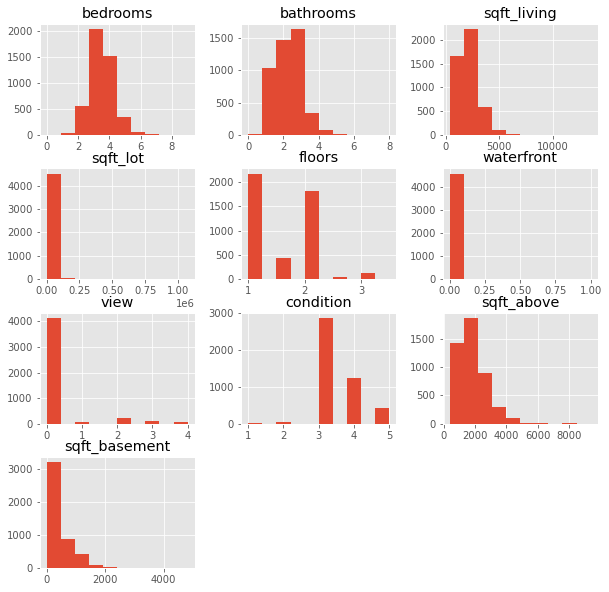

In [9]:
df_f.hist(figsize=(10,10))

From our summary statistic and histograms, we can conclude froum our data that most houses have 3 bedrooms, 2 bathrooms, around 2000 square-foot living, 7683 square-foot lot, 1.5 floors, no waterfronts, no view from the house, 3 conditions, 1590 square-foot above, 0 square foot basement or no basement at all. 

Let's see the distribution of the target price variable.

In [8]:
df_t.head()

,price
0,313000.0
1,2384000.0
2,342000.0
3,420000.0
4,550000.0


In [9]:
df_t.describe()

,price
count,4.600000e+03
mean,5.519630e+05
std,5.638347e+05
min,0.000000e+00
25%,3.228750e+05
50%,4.609435e+05
75%,6.549625e+05
max,2.659000e+07


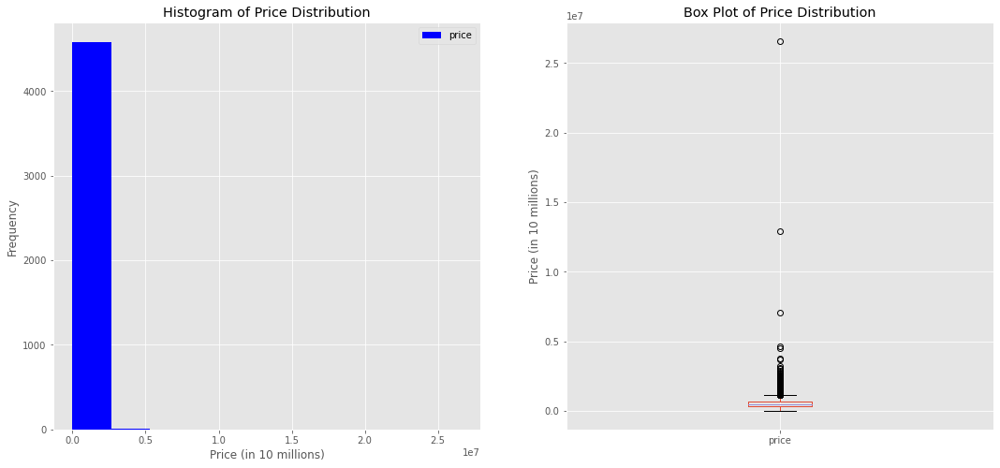

In [10]:
fig = plt.figure() # create figure

ax0 = fig.add_subplot(1, 2, 1)
ax1 = fig.add_subplot(1, 2, 2)

# Subplot 1: Histogram
df_t.plot(kind='hist', color='blue', figsize=(18, 8), ax=ax0)
ax0.set_title('Histogram of Price Distribution')
ax0.set_xlabel('Price (in 10 millions)')

# Subplot 2: Box plot
df_t.plot(kind='box', figsize=(18, 8), ax=ax1)
ax1.set_title ('Box Plot of Price Distribution')
ax1.set_ylabel('Price (in 10 millions)')

plt.show()

As we can see, the price distribution is highly skewed to the right. Most price data is in the range of less than $2.5 millions and there a lot of outliers.

<p>I am going to visualize the relationship between each independent variables on the target price. The relationship between the two variables will be plotted on a scatter plot. </p>

<p>Scatter plots are useful for us to determine the right model for predicting future data based on the existing data that we have.</p>

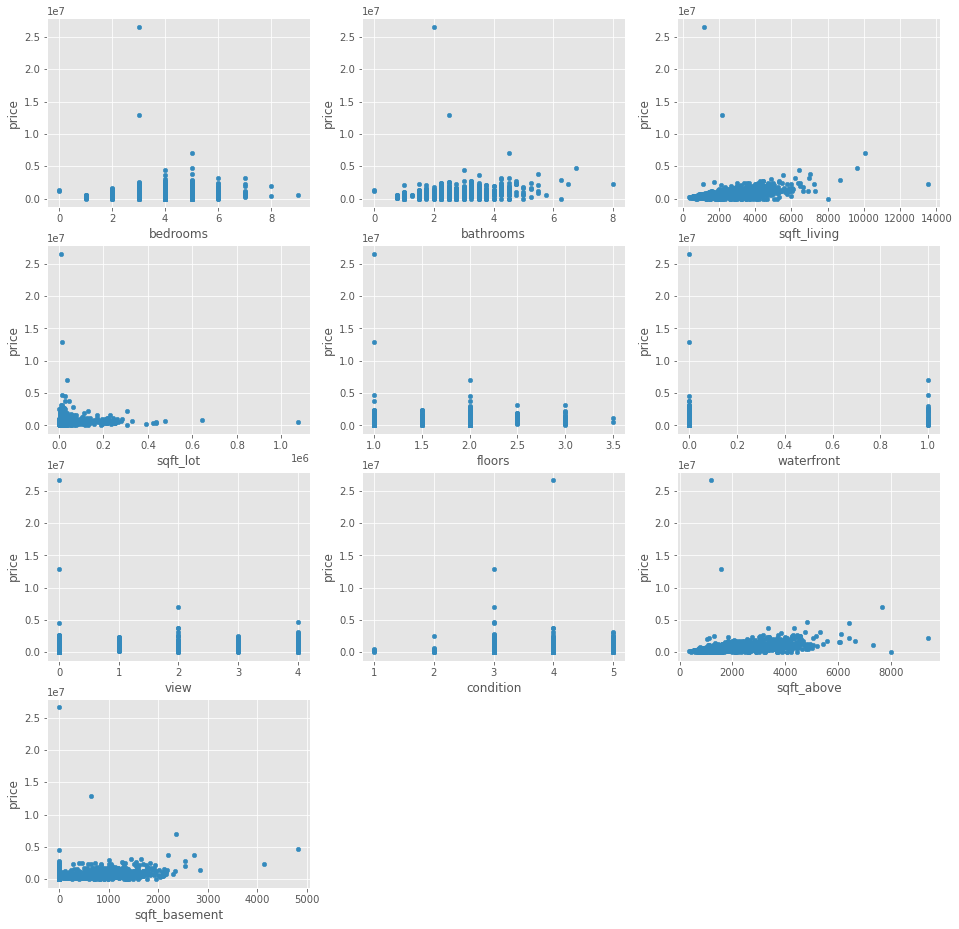

In [11]:
fig = plt.figure() # create figure

axes = {} # dict that saves the axes for subplot

cols = list(cdf.columns)
cols.remove('price')

col = 3
row = int(np.ceil(len(cols)/col))

for ix in range(len(cols)):
    axes[ix] = fig.add_subplot(row, col, ix+1)
    
    # Output subplot
    cdf.plot(kind='scatter', x=cols[ix], y='price', figsize=(16, 16), ax=axes[ix])

Based on the graph above, I observe that a linear relationship or polynomial model might be suitable. So I will make various types of suitable models, namely Simple Linear Regression, Multiple Linear Regression, and Polynomial Regression and compare the accuracy values to determine which model to use later.

#### Model 1: Simple Linear Regression

In Simple Linear Regression, there is only one predictor variable and one target variable.

<p><b>Regression plots</b> is an excellent way to visualize the relationship between the predictor and target variable. Since we can see the direction, shape and strength of the line as well as spot any outliers. </p>

<p>This plot will show a combination of a scattered data points, as well as the fitted <b>linear regression</b> line going through the data.
    
<p>I am going to plot linear regressions for each independent predictors as follows.</p>

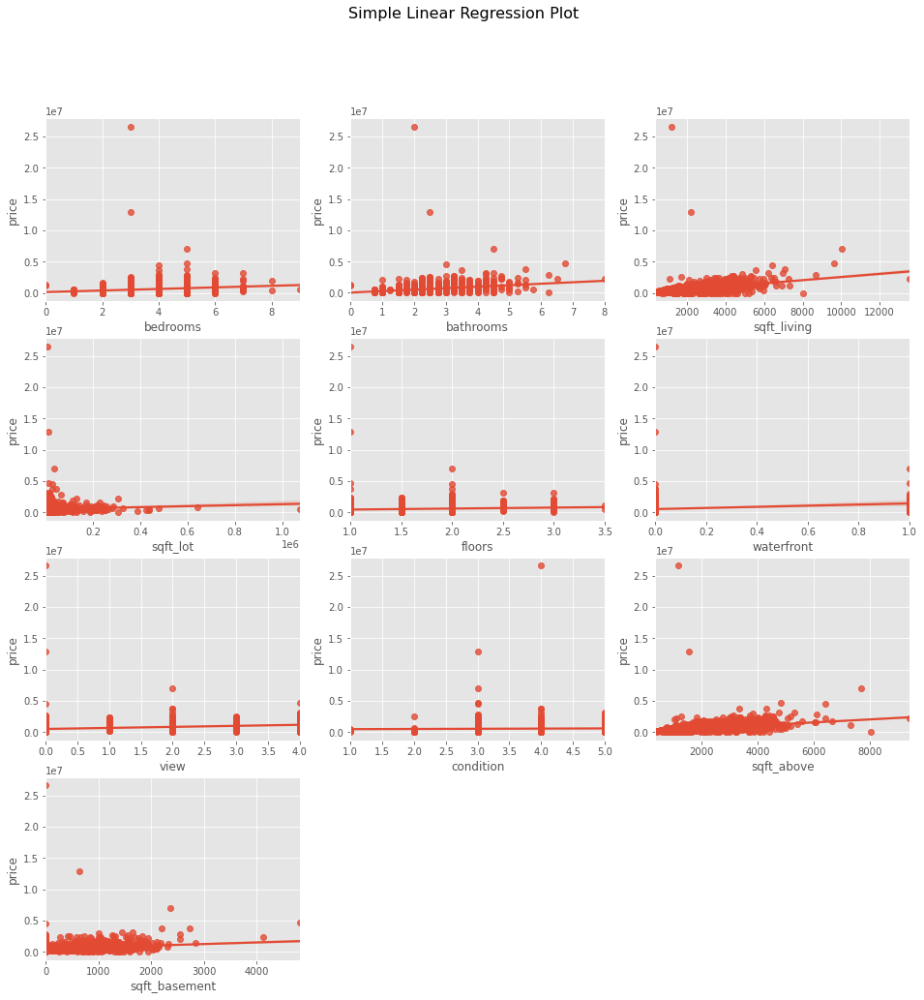

In [12]:
fig = plt.figure() # create figure
fig.set_size_inches(16, 16)
fig.suptitle('Simple Linear Regression Plot', fontsize=16)

axes = {} # dict that saves the axes for subplot

cols = list(cdf.columns)
cols.remove('price')

col = 3
row = int(np.ceil(len(cols)/col))

for ix in range(len(cols)):
    axes[ix] = fig.add_subplot(row, col, ix+1)
    
    # Output subplot
    sns.regplot(x=cols[ix], y="price", data=cdf, ax=axes[ix])

All of the above regression plots have positive directions, and most of the points are grouped at values less than the median for each variable. The sqft_living regression plot appears to have the steepest curve, and we can prove this by calculating the pearson correlation value in the step below.

#### Pearson Correlation

I will compute pairwise linear correlation of selected features against the price using the standard pearson correlation coefficient. The coefficient value will help us in comparing the strength of linear association between each feature and target price. The greater the value, the more sure we are that the feature (predictor) has a strong linear relationship with the price.

In [13]:
pearson = cdf.corr()
pearson.sort_values(by='price', ascending=False)

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,price
price,0.200336,0.327110,0.430410,0.050451,0.151461,0.135648,0.228504,0.034915,0.367570,0.210427,1.000000
sqft_living,0.594884,0.761154,1.000000,0.210538,0.344850,0.117616,0.311009,-0.062826,0.876443,0.447206,0.430410
sqft_above,0.484705,0.689918,0.876443,0.216455,0.522814,0.078911,0.174327,-0.178196,1.000000,-0.038723,0.367570
bathrooms,0.545920,1.000000,0.761154,0.107837,0.486428,0.076232,0.211960,-0.119994,0.689918,0.298020,0.327110
view,0.111028,0.211960,0.311009,0.073907,0.031211,0.360935,1.000000,0.063077,0.174327,0.321602,0.228504
sqft_basement,0.334165,0.298020,0.447206,0.034842,-0.255510,0.097501,0.321602,0.200632,-0.038723,1.000000,0.210427
bedrooms,1.000000,0.545920,0.594884,0.068819,0.177895,-0.003483,0.111028,0.025080,0.484705,0.334165,0.200336
floors,0.177895,0.486428,0.344850,0.003750,1.000000,0.022024,0.031211,-0.275013,0.522814,-0.255510,0.151461
waterfront,-0.003483,0.076232,0.117616,0.017241,0.022024,1.000000,0.360935,0.000352,0.078911,0.097501,0.135648
sqft_lot,0.068819,0.107837,0.210538,1.000000,0.003750,0.017241,0.073907,0.000558,0.216455,0.034842,0.050451


The top five features respectively in descending order are: sqft_living, sqft_above, bathrooms, view, and sqft_basement.

<p>Because sqft_living is the most significant predictor variable of house price, I will use it for constructing a Simple Linear Regression model.</p>

Let's draw a residual plot that shows the residuals on the vertical y-axis and the independent variable on the horizontal x-axis.

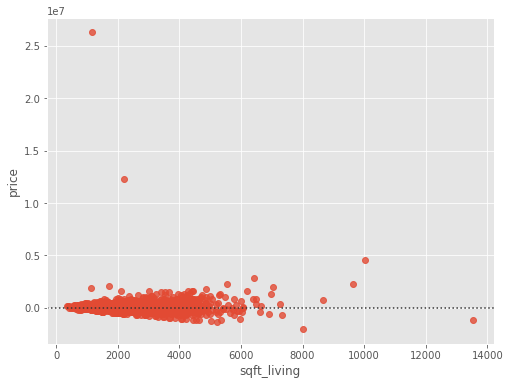

In [14]:
plt.figure(figsize=(8, 6))
sns.residplot(x = df_f['sqft_living'], y = df_t)
plt.show()

The points in a residual plot are randomly spread out around the x-axis this indicates that a linear model may be suitable to use.

##### Train/Test Split

Before moving forward to the modelling stage, I am going to do Train/Test split on existing datasets. This step involves splitting the dataset into training and testing sets respectively, which are mutually exclusive. 
Training data will be used to train the regression model, while test data will be used to test models accuracy. I will set 20% of the data as test data and 80% of the data as train data.

In [15]:
X_train, X_test, y_train, y_test = train_test_split(df_f, df_t, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (3680, 10) (3680, 1)
Test set: (920, 10) (920, 1)


##### Modeling

sqft_living feature is selected as the predictor variable of house price since it has the strongest relation to the target variable, which is the house price.

In [16]:
sreg = linear_model.LinearRegression()
sreg.fit (X_train[['sqft_living']], y_train)

# The coefficients
print ('Coefficients: ', sreg.coef_)
print ('Intercept: ', sreg.intercept_)

Coefficients:  [[253.31303137]]
Intercept:  [13242.42035033]


##### Model Function

<p>The simple linear regression can be constructed using the above values as follows:</p>
<p>price = <b>13242.42035033</b> + sqft_living * <b>253.31303137</b></p>

##### Prediction

In [17]:
Yhat_sreg = sreg.predict(X_test[['sqft_living']])
Yhat_sreg[0:5] # Output the first 5 predicted values

array([[ 598395.52281819],
       [ 383079.44615253],
       [ 393211.96740738],
       [ 436275.18274051],
       [1183548.62528604]])

#### Model 2: Multiple Linear Regression

Multiple Linear Regression requires more than one independent variables as predictors.

Referring to the Pearson correlation table, I choose the top 5 features that have the strongest positive correlation values as predictors of house prices, because the strong correlation values indicate that there is a significant relationship between the predictors and the target value. The selected features are: sqft_living, sqft_above, bathrooms, view, and sqft_basement.

##### Modeling

In [19]:
X = ['sqft_living', 'sqft_above', 'bathrooms', 'view', 'sqft_basement']

mreg = linear_model.LinearRegression()
mreg.fit (X_train[X], y_train)

# The coefficients
print ('Coefficients: ', mreg.coef_)
print ('Intercept: ', mreg.intercept_)

Coefficients:  [[  159.79179237    74.05010842   295.87152249 66436.70880995
     85.74168395]]
Intercept:  [34446.21344572]


##### Model Function

<p>The Multiple Linear Regression can be constructed using the above values as follows:</p>
<p>price = <b>34446.21344572</b> + sqft_living * <b>159.79179237</b> + sqft_above * <b>74.05010842</b> + bathrooms * <b>295.87152249</b> + view * <b>66436.70880995</b> + sqft_basement * <b>85.74168395</b></p>

##### Prediction

In [20]:
Yhat_mreg = mreg.predict(X_test[X])
Yhat_mreg[0:5] # Output the first 5 predicted values

array([[ 575434.6509675 ],
       [ 509320.54927035],
       [ 385726.8398016 ],
       [ 425553.93081726],
       [1115535.47392182]])

Because it is complicated to see the Multiple Linear Regression line, let's us use the <b>distribution plot</b> , so that we can look at the distribution of the fitted values that result from the model and compare it to the distribution of the actual values.

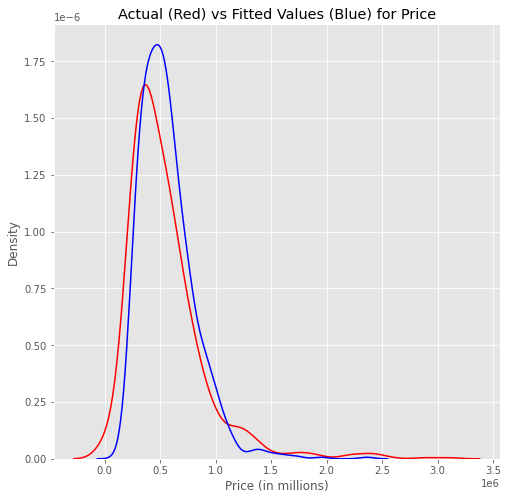

In [22]:
plt.figure(figsize=(8, 8))

ax1 = sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(Yhat_mreg, hist=False, color="b", label="Fitted Values" , ax=ax1)

plt.title('Actual (Red) vs Fitted Values (Blue) for Price')
plt.xlabel('Price (in millions)')

plt.show()
plt.close()

From the distribuion plot above, we can see that the fitted values is quite close to the actual values. However, there are occassions when the model (shown in red) predicts lower price values and higher price values than the actual values. 

#### Polynomial Regression

For polynominal regression, I am going to use the sqft_living feature as predictor of price. To fit the data to the polynomial function, I will use PolynomialFeatures() function in Scikit-learn library. Let's us try to plot a polynomial regression function when degree is selected.

##### Modeling

In [23]:
poly = PolynomialFeatures(degree=2)
x_train_poly = poly.fit_transform(X_train[['sqft_living']])
x_test_poly = poly.fit_transform(X_test[['sqft_living']])
poly

PolynomialFeatures()

In [24]:
preg = linear_model.LinearRegression()
preg.fit(x_train_poly, y_train)

# The coefficients
print ('Coefficients: ', preg.coef_)
print ('Intercept: ', preg.intercept_)

Coefficients:  [[0.00000000e+00 1.51098117e+02 1.70696304e-02]]
Intercept:  [137681.00394634]


##### Model Function

The Polynomial Regression function can be constructed using the above values as follows:

price = <b>137681.00394634</b> + <b>151.098117</b> * sqft_living + <b>0.0170696304</b> * sqft_living

##### Prediction

In [25]:
Yhat_preg = preg.predict(x_test_poly)
Yhat_preg[0:5] # Output the first five prediction values 

array([[ 577802.90869283],
       [ 394669.87878261],
       [ 402734.84769579],
       [ 437620.35138081],
       [1200095.32259999]])

Let us visualize the polynomial function of order 2 using seaborn package

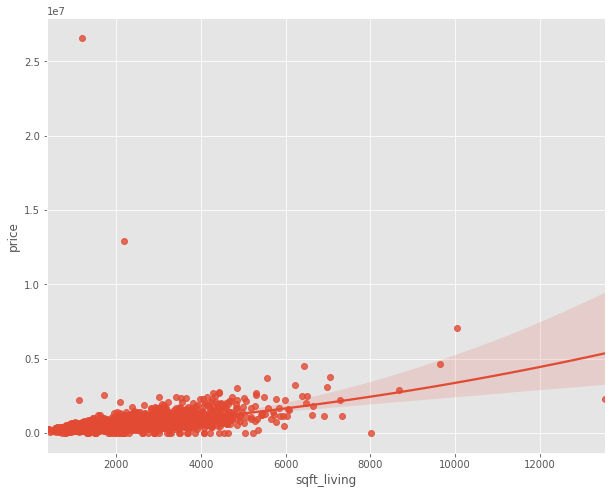

In [26]:
plt.figure(figsize=(10, 8))
sns.regplot(x='sqft_living', y='price', data=cdf, order=2)
plt.show()

The red dots on the above chart represent the training and testing data of sqft_living feature. The red line is the polynomial regression function with degree 2 order.

In order to determine the best order for the polynomial function, we must calculate the R-squared score for each order. Let's see how the R^2 changes on the test data for different order polynomials and plot the results below

Text(0.5, 1.0, 'R^2 Using Test Data')

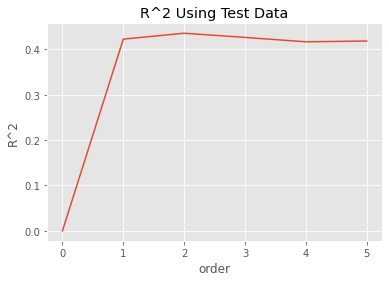

In [27]:
Rsqu_test = []

order = [x for x in range(6)]
for n in order:
    poly = PolynomialFeatures(degree=n)
    
    x_train_poly = poly.fit_transform(X_train[['sqft_living']])
    x_test_poly = poly.fit_transform(X_test[['sqft_living']])    
    
    preg.fit(x_train_poly, y_train)
    
    Rsqu_test.append(preg.score(x_test_poly, y_test))

plt.plot(order, Rsqu_test)
plt.xlabel('order')
plt.ylabel('R^2')
plt.title('R^2 Using Test Data')

We can clearly see that order 2 has the best R-squared score, so we can stick with that order.

### Measures for Out-of-Sample Evaluation

For out of sample evaluation, we use new data, which are not exist in the dataset, in order to build the model.  This evaluation method is often considered the best method for testing how good the model is for predicting results on unseen new data.

We compare the actual values and predicted values to calculate the accuracy of each regression model's predictive performance.

The evaluation metrics that I will consider to calculate the accuracy of regression models on the test set are:
<ul>
    <li>
        Mean Squared Error (MSE) = the mean of the squared error.
    </li>
    <li>
        R-squared = represents how close the data are to the fitted regression line. The higher the R-squared, the better the model fits your data. The value ranges from -1.0 (the worst) to 1.0 (the best).
    </li>
</ul>

#### Model 1: Simple Linear Regression

In [28]:
mse_sreg = mean_squared_error(y_test, Yhat_sreg)
print('The mean square error of price and predicted value is: ', mse_sreg)

r2_sreg = r2_score(y_test, Yhat_sreg)
print('The R^2 score of price and predicted value is: ', r2_sreg)

The mean square error of price and predicted value is:  76018025505.8428
The R^2 score of price and predicted value is:  0.4227888755214022


The R-squared value of SLR model tells us that around 42% of the variance in the target variable is explained by the model

#### Model 2: Multiple Linear Regression

In [29]:
mse_mreg = mean_squared_error(y_test, Yhat_mreg)
print('The mean square error of price and predicted value is: ', mse_mreg)

r2_mreg = r2_score(y_test, Yhat_mreg)
print('The R^2 score of price and predicted value is: ', r2_mreg)

The mean square error of price and predicted value is:  70852399099.46388
The R^2 score of price and predicted value is:  0.46201190199205344


The R-squared value of MLR model tells us that around 46% of the variance in the target variable is explained by the model

#### Model 3: Polynomial Regression

In [31]:
mse_preg = mean_squared_error(y_test, Yhat_preg)
print('The mean square error of price and predicted value is: ', mse_preg)

r2_preg = r2_score(y_test, Yhat_preg)
print('The R^2 score of price and predicted value is: ', r2_preg)

The mean square error of price and predicted value is:  74315698640.89247
The R^2 score of price and predicted value is:  0.43571478352032256


The R-squared value of Polynomial model tells us that around 43% of the variance in the target variable is explained by the model

## Decision Making <a name="decision">

We have visualized different prediction models, and now is a good time to decide which one of the three models to use as the main model in predicting future prices from the unknown dataset. In this chapter, we will compare the accuracy metrics, namely R-squared and MSE for each model. The model with the best accuracy value will be selected.

Let's display the accuracy values that we calculated in table form to make it easier for us to compare values.


| Algorithm          | R-squared| MSE      |
| ------------------ | ------- | -------- |
| Simple Linear Regression | 0.422   | 76018025505.842   |
| Multiple Linear Regression | 0.462   | 70852399099.463    |
| Polynomial Regression | 0.435   | 74315698640.892    |

We should choose the model with the highest R-squared value, and the smallest MSE value for the best fit of the data.

Comparing the models on the above accuracy table, we can conclude that the Multiple Linear Regression (MLR) model satisfies the criteria for the best fitted model to predict target price. MLR model has the highest R-squared value of 0.462 and the lowes MSE value of 70852399099.463. The result is plausbile because there are 5 predictor variables with the highest pearson correlation value used to train the model for predicting the price response variable.

## Results and Discussion <a name="results">

This project analyzes property data from the Kaggle dataset. The dataset contains no missing values, so further analysis can be carried out immediately. Exploratory Data Analysis (EDA) is conducted to see the main characteristics of each individual feature. Scatter plots were constructed to visualize the signifcance the relationship between each predictor feature and the target price. All features are positively correlated with the target price, that is, as the value of the independent variable (predictor) increases, the value of the dependent variable (target price) also increases. However, most of the correlations are weak, and the regression lines are close to the x-axis. The pearson correlation table was created to make it easier to see the strength of the linear relationship between different features on the target price. 'sqft_living' was the most significant predictor of price with a pearson value of 0.43, followed by 'sqft_above', 'bathrooms', 'view', and 'sqft_basement' respectively.

Multiple regressions model are created to fit the relationship between the chosen predictors and the target prices. The models built in this project are Simple Linear Regression, Multiple Linear Regression, and Polynomial Regression with 2nd order degree. The model is in the form of regression line that fits the value on the scatter plot. All models are evaluated by creating visual representations and calculating the accuracy values. The accuracy values of the models were compared with each others and the MLR model was determined as the best model in predicting property prices based on house characteristics.

Please note that this project is merely an observational study, so that no causal effect can be concluded. This project only takes into account the house price data source from Kaggle. Analyzes were performed on the data to see how different features correlate with house prices. Hereafter, several models are created based on the correlation.

## Conclusion <a name="conclusion">

The purpose of this project is to help homeowners look at the relevant factors that influence home prices and decide the best price for houses based on some characteristics. Statistical analysis was performed, and prediction models using regression technique was constructed to determine the price of unknown data that had many characteristics. After calculating and comparing accuracy values, the Multiple Linear Regression model was selected as the best model in predicting future house prices.

The analysis of this project should be used for consideration only. The final decision made by the audience are on their own, and the outcome of the decision is beyond the responsibility of the author in this project.